# Baseline

Very TLDR : Create a dict of df (per bookingID) -> create feature using statistical measurement -> xgboost -> explain model with shap -> baseline achive 0.74 AUC & 0.65 AUC (if explainability more preferable)

TLDR

analyze per bookingID :  
-turn out there are some uncomplete data, some of them only 50% of total trip
-erroneous data, maybe because some phone is not calibrated  
-Speed data might had already transformed, not sure (Only handful occurence above 35 Speed)
-



OK now move on, let the code say it all!

- [Import and Merge Data](#importMerge)
    - [Create dict of dataframe per bookingID](#)
- [Function](#function)
- [Feature Engineering](#fe)
- [EDA](#eda)
- [1st Model Experiment](#me)
- [2nd Model Experiment](#me)





## Import and Merge Data

<a id="importMerge"></a>

In [62]:
%matplotlib inline
import pandas as pd
import numpy as np
import glob
import gc
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import copy
import pickle
import swifter
import sys
pd.set_option('display.max_columns', 500)
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.ensemble import RandomForestClassifier
import shap

In [2]:
%%time

# label file
data = pd.read_csv('safety/labels/part-00000-e9445087-aa0a-433b-a7f6-7f4c19d78ad6-c000.csv')

# feature file
files = glob.glob("safety/features/*.csv")
features = [pd.read_csv(f) for f in files]
all_features = pd.concat(features,ignore_index=True)

# del features
# gc.collect()

CPU times: user 31.2 s, sys: 5.11 s, total: 36.3 s
Wall time: 1min


In [3]:
%%time
# change dtype
all_features = all_features.astype({
    'bookingID': 'int64', 
    'Accuracy':'float32',
    'Bearing':'float32',
    'acceleration_x':'float32',
    'acceleration_y':'float32',
    'acceleration_z':'float32',
    'gyro_x':'float32',
    'gyro_y':'float32',
    'gyro_z':'float32',
    'second':'float32',
    'Speed':'float32'
})

all_features.sort_values(['bookingID','second'], inplace=True)
all_features.reset_index(drop=True, inplace=True)

CPU times: user 20 s, sys: 3.59 s, total: 23.6 s
Wall time: 23.6 s


In [4]:
all_features.head()

,bookingID,Accuracy,Bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,Speed
0,0,12.0,143.298294,0.818112,-9.941462,-2.014999,-0.016245,-0.094040,0.070732,0.0,3.442991
1,0,8.0,143.298294,0.546405,-9.835589,-2.038925,-0.047092,-0.078874,0.043187,1.0,0.228454
2,0,8.0,143.298294,-1.706207,-9.270792,-1.209448,-0.028965,-0.032652,0.015390,2.0,0.228454
3,0,8.0,143.298294,-1.416705,-9.548032,-1.860977,-0.022413,0.005049,-0.025753,3.0,0.228454
4,0,8.0,143.298294,-0.598145,-9.853534,-1.378574,-0.014297,-0.046206,0.021902,4.0,0.228454


In [5]:
%%time
# create dict

df_dict = {}
cnt = 0
for booking_id in data['bookingID']:

    #df_dict[booking_id] = all_features.loc[all_features.bookingID==booking_id]
    df_dict[booking_id] = copy.deepcopy(all_features.loc[all_features.bookingID==booking_id])
    #df_dict[booking_id] = all_features.query('bookingID == @booking_id')
    
df_dict.keys()

CPU times: user 10min 14s, sys: 848 ms, total: 10min 15s
Wall time: 10min 15s


In [196]:
df_dict[0].head()
#save_obj(df_dict,'df_dict')

,bookingID,Accuracy,Bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,Speed
0,0,12.0,143.298294,0.818112,-9.941462,-2.014999,-0.016245,-0.094040,0.070732,0.0,3.442991
1,0,8.0,143.298294,0.546405,-9.835589,-2.038925,-0.047092,-0.078874,0.043187,1.0,0.228454
2,0,8.0,143.298294,-1.706207,-9.270792,-1.209448,-0.028965,-0.032652,0.015390,2.0,0.228454
3,0,8.0,143.298294,-1.416705,-9.548032,-1.860977,-0.022413,0.005049,-0.025753,3.0,0.228454
4,0,8.0,143.298294,-0.598145,-9.853534,-1.378574,-0.014297,-0.046206,0.021902,4.0,0.228454


## Function

In [3]:
"""
This cell contain function to save object & load object

Used to save file to disk after aggregation to save time.
Will not be used in submission.
"""

def save_obj(obj, name ):
    with open('/jet/prs/aiforsea/'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name ):
    with open('/jet/prs/aiforsea/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [140]:
def plot_all(number):
    """
    Barbaric plot all column
    
    Will generate a side by side comparison of dangerous driving and safe driving data.
    Used for random check.
    
    Input:
    number      random number as you wish
    df_dict     list containing dataframe per bookingID
    data df     label data
    """
    d_df = data.loc[data.label==1].reset_index(drop=True)['bookingID']
    s_df = data.loc[data.label==0].reset_index(drop=True)['bookingID']
    
    
    d = df_dict[d_df[number]]
    s = df_dict[s_df[number]]
    print('dangerous (left) : id ',d_df[number])
    print('safe (right) : id ',s_df[number])


    y1 = 'acceleration_x'
    y2 = 'acceleration_y'
    y3 = 'acceleration_z'
    y4 = 'Bearing'
    y5 = 'gyro_x'
    y6 = 'gyro_y'
    y7 = 'gyro_z'
    y8 = 'Speed'
    
    
    
    
    x_d = np.linspace(0,d.tail(1)['second'],d.tail(1)['second']+1).flatten()
    x_s = np.linspace(0,s.tail(1)['second'],s.tail(1)['second']+1).flatten()
    
    yd_secs = [-1] * (len(x_d))
    ys_secs = [-1] * (len(x_s))
    
    
    
    
    for i in d.second.tolist():
        yd_secs[int(i)] = i
    
    for i in s.second.tolist():
        ys_secs[int(i)] = i
    
    
    fig, axs = plt.subplots(nrows=9, ncols=2, figsize=(20,90))
    sns.lineplot(x="second", y=y1, data=d, ax=axs[0][0])
    sns.lineplot(x="second", y=y2, data=d, ax=axs[1][0])
    sns.lineplot(x="second", y=y3, data=d, ax=axs[2][0])
    sns.lineplot(x="second", y=y4, data=d, ax=axs[3][0])
    sns.lineplot(x="second", y=y5, data=d, ax=axs[4][0])
    sns.lineplot(x="second", y=y6, data=d, ax=axs[5][0])
    sns.lineplot(x="second", y=y7, data=d, ax=axs[6][0])
    sns.lineplot(x="second", y=y8, data=d, ax=axs[7][0])
    sns.lineplot(x=x_d, y=yd_secs, data=d, ax=axs[8][0])
    
    
    
    sns.lineplot(x="second", y=y1, data=s, ax=axs[0][1])
    sns.lineplot(x="second", y=y2, data=s, ax=axs[1][1])
    sns.lineplot(x="second", y=y3, data=s, ax=axs[2][1])
    sns.lineplot(x="second", y=y4, data=s, ax=axs[3][1])
    sns.lineplot(x="second", y=y5, data=s, ax=axs[4][1])
    sns.lineplot(x="second", y=y6, data=s, ax=axs[5][1])
    sns.lineplot(x="second", y=y7, data=s, ax=axs[6][1])
    sns.lineplot(x="second", y=y8, data=s, ax=axs[7][1])
    sns.lineplot(x=x_s, y=ys_secs, data=s, ax=axs[8][1])

In [8]:
def statform(booking_id,var):
    """
    Generate statistical measurement of a variable with the same bookingID.
    Use this in pandas apply.
    
    Input:
    booking_id      bookingID
    df_dict         list containing dataframe per bookingID
    data df         label data
    """
    booking_id = booking_id.bookingID
    std = df_dict[booking_id][var].std()
    maxx = df_dict[booking_id][var].max()
    minn = df_dict[booking_id][var].min()
    mean = df_dict[booking_id][var].mean()
    
    return std, maxx, minn, mean

## Feature Engineering

In [21]:
%%time
cols = ['Bearing', 'acceleration_x', 'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z', 'second', 'Speed'] 

for col in cols:
    std_str = 'std_' + col
    max_str = 'max_' + col
    min_str = 'min_' + col
    mean_str = 'mean_' + col
    
    data[[std_str, max_str, min_str, mean_str]] = data.apply(lambda x:statform(x,col), axis = 1, result_type='expand')


CPU times: user 2min 18s, sys: 616 ms, total: 2min 19s
Wall time: 2min 19s


In [ ]:
#save_obj(data,'data')

In [22]:
data.head()

,bookingID,label,std_Bearing,max_Bearing,min_Bearing,mean_Bearing,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,std_second,max_second,min_second,mean_second,std_Speed,max_Speed,min_Speed,mean_Speed
0,111669149733,0,135.008469,359.0,0.0,171.860138,0.588776,2.614548,-2.825244,0.114490,0.421854,14.674510,7.163670,9.770731,0.731091,2.846793,-2.545114,0.037044,0.023377,0.144156,-0.222364,-0.000616,0.072785,0.376463,-0.391394,0.010443,0.029111,0.149720,-0.202138,0.001209,220.980774,764.0,0.0,382.000000,5.683601,19.630571,0.0,5.221818
1,335007449205,1,79.203148,359.0,0.0,226.050476,1.107360,5.616969,-4.158855,0.232874,0.596235,13.769474,6.890723,9.554995,1.524342,8.121380,-8.851634,0.869236,0.081049,0.415779,-1.319690,-0.001973,0.162387,1.639887,-0.684455,-0.005595,0.028351,0.168736,-0.327287,-0.002869,303.253204,1049.0,0.0,524.500000,6.092663,19.367985,-1.0,6.029686
2,171798691856,0,42.409569,358.0,0.0,41.356976,0.588128,2.896984,-1.864485,0.279267,0.713546,12.477382,5.531803,9.625053,0.521369,3.323152,-1.467047,-0.041197,0.052078,0.296144,-0.261522,-0.009650,0.053446,0.280964,-0.294013,0.009246,0.045928,0.114782,-0.263653,-0.031219,133.898758,939.0,0.0,724.659546,7.782730,26.500000,-1.0,16.419031
3,1520418422900,0,108.097252,358.0,0.0,204.508057,0.837849,8.741074,-8.099609,-0.534042,0.639000,12.019928,4.228897,9.824681,0.974887,8.839203,-7.429596,0.732369,0.113392,2.479202,-1.469772,-0.001024,0.115673,0.891098,-1.458145,-0.008423,0.121698,2.198975,-1.821945,0.000776,273.821014,944.0,0.0,471.481201,8.436861,24.850000,-1.0,13.459440
4,798863917116,0,34.538696,300.0,169.0,218.437836,1.558288,11.064803,-8.343793,0.133678,0.855155,15.291766,5.301960,9.619421,1.330740,6.452374,-4.419696,1.110142,0.119730,0.761138,-0.768468,0.002215,0.119985,0.535118,-0.378736,0.007722,0.026289,0.095295,-0.117286,-0.000900,160.358978,554.0,0.0,277.000000,6.829455,21.993572,0.0,8.729576


## EDA

dangerous (left) : id  274877906944
safe (right) : id  171798691856


/home/kurniawanekn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:24: DeprecationWarning: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.
/home/kurniawanekn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:25: DeprecationWarning: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.


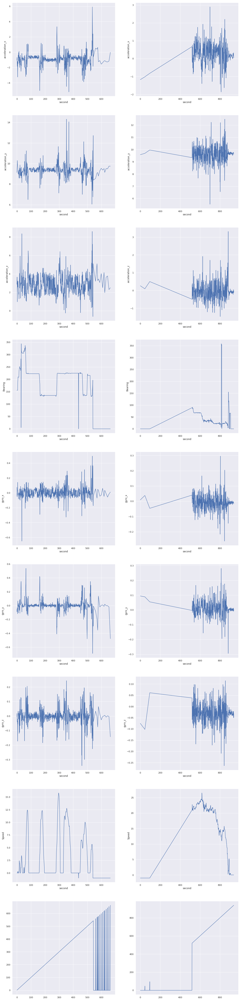

In [185]:
plot_all(1)

dangerous (left) : id  841813590179
safe (right) : id  798863917116


/home/kurniawanekn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:24: DeprecationWarning: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.
/home/kurniawanekn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:25: DeprecationWarning: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.


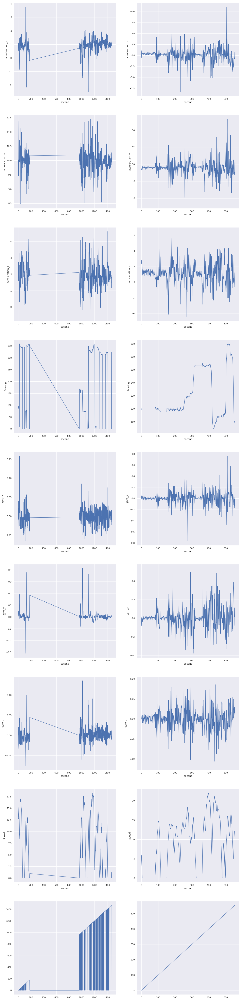

In [197]:
plot_all(3)

In [192]:
data.groupby('label').mean()

,bookingID,std_Bearing,max_Bearing,min_Bearing,mean_Bearing,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,std_second,max_second,min_second,mean_second,std_Speed,max_Speed,min_Speed,mean_Speed
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,8.057012e+11,89.816469,342.487305,10.521805,169.132894,0.837972,3.952600,-3.864904,0.075793,0.727656,8.210428,0.929901,4.607005,1.016550,5.356664,-3.528353,0.849500,0.087824,0.586716,-0.582667,-0.002036,0.138159,0.902052,-0.960729,0.000373,0.067837,0.463483,-0.473516,-0.000353,28399.304474,265404.267164,0.0,5580.745251,6.231105,20.870989,-0.145433,8.607595
1,8.478855e+11,95.437278,352.250408,3.390275,166.455361,1.006134,4.989229,-4.861779,0.062887,0.993236,9.329492,-0.593845,4.476605,1.284082,7.191362,-4.908238,1.074909,0.121173,0.896972,-0.903836,-0.001189,0.176280,1.345163,-1.350757,-0.001016,0.106650,0.812986,-0.822121,-0.000290,333.243356,1174.160968,0.0,622.060249,6.390365,21.248787,-0.484053,7.885471


In [193]:
data.groupby('label').max()

,bookingID,std_Bearing,max_Bearing,min_Bearing,mean_Bearing,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,std_second,max_second,min_second,mean_second,std_Speed,max_Speed,min_Speed,mean_Speed
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1700807049407,176.732925,359.999481,356.062927,357.661652,5.664173,47.708321,8.158600,10.005867,9.606841,61.159355,31.321732,39.250732,14.092091,63.656803,22.955051,38.705826,2.879531,39.839748,0.017577,0.475221,5.588273,62.542023,0.000586,5.929297,4.129503,66.300781,0.050702,0.238175,1.749919e+08,1.495797e+09,0.0,5.406754e+07,14.588523,56.698967,25.296043,29.557196
1,1709396983975,164.077057,359.998535,267.000000,295.891327,7.507056,66.873459,7.536194,9.895411,9.968711,75.055885,16.288319,35.782925,10.676776,78.055756,8.035934,15.907887,2.391696,30.709417,-0.041168,0.304001,7.162808,80.314964,0.088104,8.277215,3.563097,55.948853,-0.047421,1.352504,2.363168e+03,8.235000e+03,0.0,7.019637e+03,13.187648,148.018631,13.000000,22.364120


In [186]:
%%time
data.groupby('label').min()

CPU times: user 20 ms, sys: 0 ns, total: 20 ms
Wall time: 20 ms


,bookingID,std_Bearing,max_Bearing,min_Bearing,mean_Bearing,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,std_second,max_second,min_second,mean_second,std_Speed,max_Speed,min_Speed,mean_Speed
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0.0,0.0,0.0,0.0,0.006734,-7.12121,-33.440838,-9.818555,0.010076,-9.085068,-57.800190,-10.027811,0.010794,-8.326172,-78.448418,-9.980589,0.000000,-1.160606,-33.471748,-1.460754,0.000000,-1.342323,-74.888611,-1.663984,0.000000,-0.145386,-36.511543,-0.276815,34.785053,119.0,0.0,59.5,0.0,-1.0,-1.719776,-1.0
1,1,0.0,0.0,0.0,0.0,0.049803,-7.00441,-78.419685,-9.765013,0.031569,-8.905774,-72.994118,-10.079196,0.075710,-7.417890,-75.936989,-9.792456,0.010568,0.004930,-48.455750,-0.234141,0.000596,0.024477,-57.344891,-18.401295,0.010061,-0.173050,-53.554451,-0.347091,34.785053,119.0,0.0,59.5,0.0,-1.0,-2.000000,-1.0


In [188]:
df_dict[1357209665607] #check max_acceleration_y>75

,bookingID,Accuracy,Bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,Speed
12991661,1357209665607,15.467000,134.0,-2.316697,5.288102,8.196445,0.261189,-0.005568,-0.800565,0.0,1.430169
12991662,1357209665607,15.504000,118.0,-2.498244,4.962586,9.880832,0.103515,-0.069185,-0.274785,1.0,1.644686
12991663,1357209665607,15.565000,120.0,-1.853744,6.019387,7.782582,-0.302186,0.076829,1.194748,2.0,2.015088
12991664,1357209665607,15.671000,116.0,-2.215250,2.016990,10.141742,-0.040090,0.364163,0.134827,3.0,2.615626
12991665,1357209665607,15.596000,109.0,-2.443790,3.514152,9.636039,0.033999,0.121981,-0.418094,4.0,2.874273
12991666,1357209665607,15.795000,102.0,-1.314225,2.436838,8.549905,-0.110567,0.247086,0.270648,5.0,3.402670
12991667,1357209665607,15.941000,93.0,-0.690239,7.111842,10.371768,0.015935,0.197362,-0.421514,6.0,3.950592
12991668,1357209665607,25.000000,91.0,-3.085130,1.826431,10.309988,0.035151,0.181793,0.175353,7.0,4.116107
12991669,1357209665607,25.000000,86.0,-3.577330,5.809483,8.220367,0.187187,-0.033580,-0.374373,8.0,4.076145
12991670,1357209665607,25.000000,84.0,-1.289594,5.260176,8.339483,-0.155648,0.133675,0.523965,9.0,4.008349


In [33]:
import seaborn as sns
corr = data.corr()
plt.figure(figsize = (20,20))


# ax = sns.heatmap(corr, 
#             xticklabels=corr.columns.values,
#             yticklabels=corr.columns.values)
corr

,bookingID,label,std_Bearing,max_Bearing,min_Bearing,mean_Bearing,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,std_second,max_second,min_second,mean_second,std_Speed,max_Speed,min_Speed,mean_Speed
bookingID,1.000000,0.036927,0.012489,0.014409,-0.002782,-0.000348,0.019702,0.014401,-0.016112,-0.002623,0.020358,0.008557,-0.000018,0.004455,0.019921,0.020833,-0.001974,0.011506,0.012037,0.020567,-0.018988,0.019266,0.005619,0.011599,-0.007847,0.008270,0.013131,0.018829,-0.014604,0.007625,0.009952,0.014842,NaN,0.004131,-0.011659,-0.010984,-0.001573,-0.006697
label,0.036927,1.000000,0.086445,0.108129,-0.094873,-0.022968,0.161748,0.168132,-0.157676,-0.005575,0.165556,0.058225,-0.075477,-0.007054,0.174714,0.156554,-0.128585,0.032949,0.140700,0.133290,-0.130823,0.018595,0.073885,0.077788,-0.071253,-0.003645,0.134600,0.110876,-0.114177,0.001503,-0.007786,-0.008334,NaN,-0.005408,0.036399,0.030776,-0.089046,-0.072841
std_Bearing,0.012489,0.086445,1.000000,0.521871,-0.463178,-0.036817,0.069103,0.077586,-0.067827,0.008960,0.032204,0.111620,0.073669,0.100415,0.054341,0.076497,-0.006493,0.053875,0.015738,0.032854,-0.037335,0.005553,0.056572,0.047851,-0.050473,0.005092,0.048449,0.047419,-0.045196,-0.002731,0.012394,0.016380,NaN,0.007779,0.025050,-0.058800,-0.206292,-0.206425
max_Bearing,0.014409,0.108129,0.521871,1.000000,-0.320692,0.211535,0.074705,0.105747,-0.115498,-0.012513,0.047569,0.032366,-0.036619,-0.003202,0.056431,0.065211,-0.071143,-0.002963,0.041542,0.062942,-0.068939,-0.002377,0.040288,0.046420,-0.050912,-0.008305,0.045501,0.052267,-0.053239,-0.003929,0.004752,0.005157,NaN,0.003478,0.138389,0.061581,-0.249860,-0.112779
min_Bearing,-0.002782,-0.094873,-0.463178,-0.320692,1.000000,0.238806,-0.075449,-0.097203,0.097290,-0.001925,-0.041540,-0.127062,-0.069593,-0.105217,-0.055726,-0.098774,0.022108,-0.063980,-0.025940,-0.052500,0.049608,-0.003202,-0.051073,-0.049895,0.054986,0.002889,-0.042991,-0.048569,0.049742,-0.013714,-0.003655,-0.003892,NaN,-0.002752,-0.137246,-0.042924,0.349123,0.104849
mean_Bearing,-0.000348,-0.022968,-0.036817,0.211535,0.238806,1.000000,-0.017324,-0.019525,0.018020,-0.002417,-0.012616,-0.107979,-0.100670,-0.115034,-0.024098,-0.060548,-0.038661,-0.079535,-0.006277,-0.014911,0.017471,-0.004617,-0.049812,-0.042383,0.039826,-0.005073,-0.043810,-0.034998,0.043008,-0.017606,0.003049,0.001046,NaN,0.002725,0.020551,0.075977,0.042760,0.113995
std_acceleration_x,0.019702,0.161748,0.069103,0.074705,-0.075449,-0.017324,1.000000,0.712078,-0.705804,-0.021267,0.765940,0.253764,-0.221726,0.024589,0.743795,0.501257,-0.450840,0.073436,0.593048,0.494103,-0.460823,0.091343,0.234805,0.186053,-0.195416,0.001767,0.528525,0.385127,-0.400510,-0.023286,-0.005378,-0.005584,NaN,-0.003404,-0.034633,-0.048252,-0.070157,-0.046593
max_acceleration_x,0.014401,0.168132,0.077586,0.105747,-0.097203,-0.019525,0.712078,1.000000,-0.450974,0.338478,0.622350,0.245089,-0.201111,0.030216,0.608693,0.468506,-0.428837,0.060418,0.494970,0.449495,-0.443897,0.080088,0.184947,0.172869,-0.183451,0.001292,0.420989,0.360197,-0.365130,-0.005154,-0.004663,-0.003710,NaN,-0.004020,0.012617,-0.011201,-0.095008,-0.067052
min_acceleration_x,-0.016112,-0.157676,-0.067827,-0.115498,0.097290,0.018020,-0.705804,-0.450974,1.000000,0.365237,-0.601831,-0.221720,0.223308,-0.009730,-0.580438,-0.455370,0.421795,-0.052743,-0.467585,-0.454758,0.418200,-0.080780,-0.185191,-0.184629,0.182061,-0.004027,-0.408431,-0.343233,0.351397,0.014566,0.004385,0.005639,NaN,0.001912,-0.033694,-0.010141,0.099208,0.052687
mean_acceleration_x,-0.002623,-0.005575,0.008960,-0.012513,-0.001925,-0.002417,-0.021267,0.338478,0.365237,1.000000,-0.005781,0.060683,0.066594,0.068614,-0.006345,0.010

<Figure size 1440x1440 with 0 Axes>

## 1st Model Experiment

In [133]:
# fast import. Please run above code and delete this cell if df_dict.pkl and data.pkl didn't exist 
df_dict = load_obj('df_dict') # dict contain dataframe per bookingID, sorted by time ascending
data = load_obj('data') # label data + additional statistic transformation per bookingID

In [ ]:
%%time
X = data.drop('label', axis=1)

# drop column that didn't make any sense
X.drop('bookingID', axis=1, inplace=True)
#X.drop(['mean_second','std_second','min_second'], axis=1, inplace=True) # no meaning, represented by max second
#X.drop(['std_Bearing','max_Bearing','min_Bearing','mean_Bearing'], axis=1, inplace=True) # depends on other variable
#X.drop(['min_Speed'], axis=1, inplace=True) # all 0 

#X.drop(['mean_Speed','max_Speed','max_second'], axis=1, inplace=True)





Y = data['label']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)


model = XGBClassifier(n_estimators=10000, objective= 'binary:logistic')
#model = DecisionTreeClassifier()
#model = LogisticRegression()
#model = RandomForestClassifier()

eval_set  = [(X_train,y_train), (X_test,y_test)]
model.fit(X_train, y_train, eval_set=eval_set, eval_metric="auc", early_stopping_rounds=30)

#model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_scores = model.predict_proba(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

print("ROC_AUC: %.2f%%" % (roc_auc_score(y_test.values, y_scores[:,1])*100))

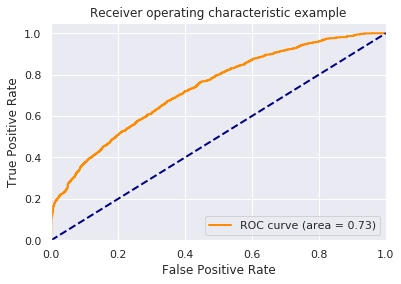

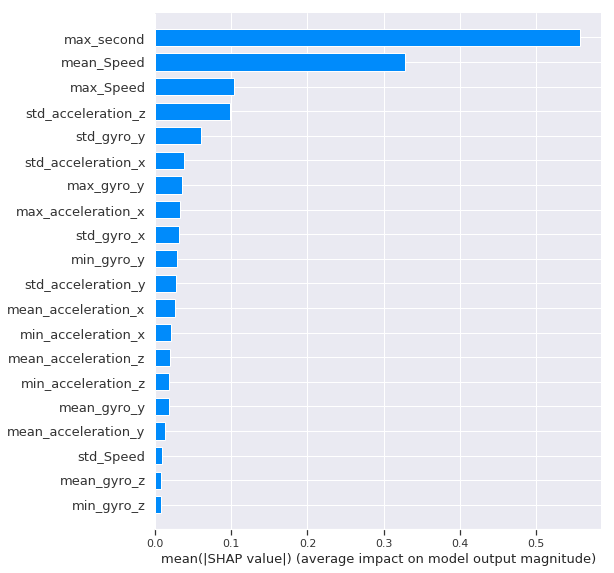

In [154]:
# Compute ROC curve and ROC area for each class
n_classes = 2


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test.values, y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
# fpr["micro"], tpr["micro"], _ = roc_curve(y_test.values, y_scores[:, i])
# roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, plot_type="bar")

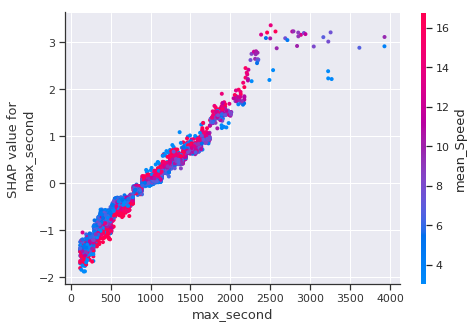

In [157]:
shap.dependence_plot("max_second", shap_values, X_test)

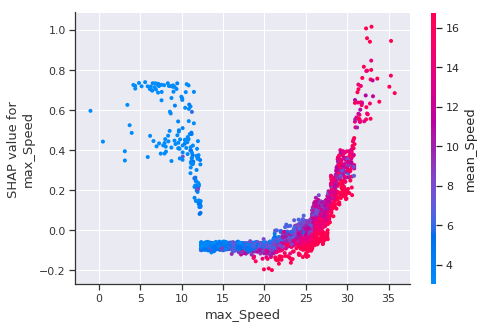

In [159]:
shap.dependence_plot("max_Speed", shap_values, X_test)

## 2nd Model Experiment

In [127]:
%%time
X = data.drop('label', axis=1)

# drop column that didn't make any sense
X.drop('bookingID', axis=1, inplace=True)
X.drop(['mean_second','std_second','min_second'], axis=1, inplace=True)
X.drop(['std_Bearing','max_Bearing','min_Bearing','mean_Bearing'], axis=1, inplace=True)
X.drop(['min_Speed'], axis=1, inplace=True)

X.drop(['mean_Speed','max_Speed','max_second'], axis=1, inplace=True) # somehow too predictive, speed should be relative by location





Y = data['label']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)


model = XGBClassifier(n_estimators=10000, objective= 'binary:logistic')
#model = DecisionTreeClassifier()
#model = LogisticRegression()
#model = RandomForestClassifier()

eval_set  = [(X_train,y_train), (X_test,y_test)]
model.fit(X_train, y_train, eval_set=eval_set, eval_metric="auc", early_stopping_rounds=30)

#model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_scores = model.predict_proba(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("ROC_AUC: %.2f%%" % (roc_auc_score(y_test.values, y_scores[:,1])*100))

[0]	validation_0-auc:0.601621	validation_1-auc:0.593941
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 30 rounds.
[1]	validation_0-auc:0.617823	validation_1-auc:0.603773
[2]	validation_0-auc:0.622693	validation_1-auc:0.606987
[3]	validation_0-auc:0.629633	validation_1-auc:0.609438
[4]	validation_0-auc:0.631246	validation_1-auc:0.609767
[5]	validation_0-auc:0.634041	validation_1-auc:0.613473
[6]	validation_0-auc:0.634965	validation_1-auc:0.613754
[7]	validation_0-auc:0.637285	validation_1-auc:0.621019
[8]	validation_0-auc:0.639517	validation_1-auc:0.621957
[9]	validation_0-auc:0.639975	validation_1-auc:0.620115
[10]	validation_0-auc:0.643522	validation_1-auc:0.626925
[11]	validation_0-auc:0.64704	validation_1-auc:0.630482
[12]	validation_0-auc:0.649181	validation_1-auc:0.630495
[13]	validation_0-auc:0.65036	validation_1-auc:0.630344
[14]	validation_0-auc:0.654115	validation_1-auc:0.632732


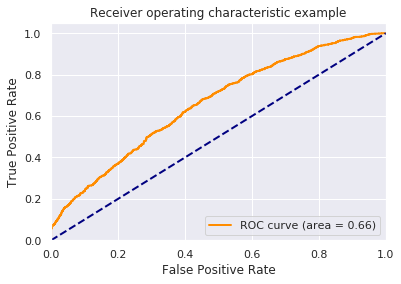

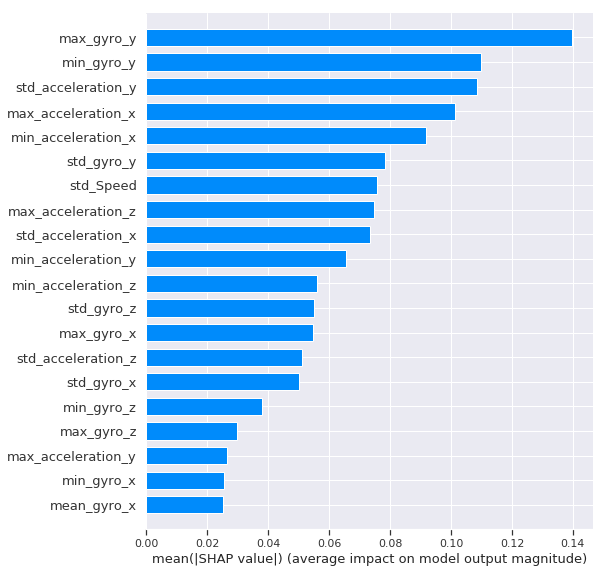

In [128]:
# Compute ROC curve and ROC area for each class
n_classes = 2


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test.values, y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
# fpr["micro"], tpr["micro"], _ = roc_curve(y_test.values, y_scores[:, i])
# roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, plot_type="bar")

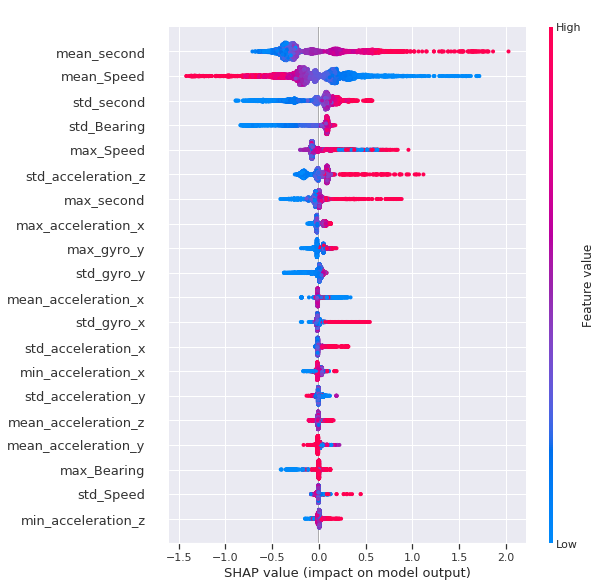

In [15]:
shap.summary_plot(shap_values, X_test)

In [160]:
shap.initjs()
index = 12
shap.force_plot(explainer.expected_value, shap_values[index,:], X_test.iloc[index,:])


In [161]:
index = 0
shap.force_plot(explainer.expected_value, shap_values[index,:], X_test.iloc[index,:])



In [69]:
shap.initjs()
index = 1
shap.force_plot(explainer.expected_value, shap_values[index,:], X_test.iloc[index,:])




In [70]:
shap.initjs()
index = 2
shap.force_plot(explainer.expected_value, shap_values[index,:], X_test.iloc[index,:])

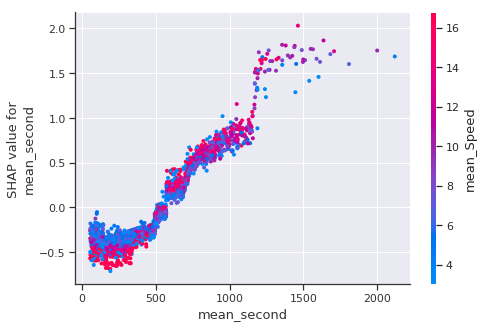

In [38]:
shap.dependence_plot("mean_second", shap_values, X_test)

In [153]:
shap.dependence_plot("max_Speed", shap_values, X_test)

AssertionError: 'shap_values' must have the same number of columns as 'features'!

In [65]:
shap.initjs()


shap.force_plot(explainer.expected_value, shap_values, X_test)

In [149]:
print("ROC_AUC: %.2f%%" % (roc_auc_score(y_test.values, y_pred)*100))

ROC_AUC: 59.11%


In [150]:
print("ROC_AUC: %.2f%%" % (roc_auc_score(y_test.values, y_scores[:,1])*100))

ROC_AUC: 73.41%


20018
32


## Summary of Baseline Model

In [152]:
X_test

,std_acceleration_x,max_acceleration_x,min_acceleration_x,mean_acceleration_x,std_acceleration_y,max_acceleration_y,min_acceleration_y,mean_acceleration_y,std_acceleration_z,max_acceleration_z,min_acceleration_z,mean_acceleration_z,std_gyro_x,max_gyro_x,min_gyro_x,mean_gyro_x,std_gyro_y,max_gyro_y,min_gyro_y,mean_gyro_y,std_gyro_z,max_gyro_z,min_gyro_z,mean_gyro_z,max_second,std_Speed,max_Speed,mean_Speed
4281,0.586600,2.871094,-3.493314,0.334404,0.460928,-6.817502,-12.689038,-9.745033,0.745929,2.471384,-4.690500,-1.038766,0.051787,0.345507,-0.470536,0.006185,0.071153,0.508794,-0.512767,0.008935,0.030311,0.123317,-0.239302,-0.006582,2504.0,8.621336,31.520000,13.965001
5869,0.574508,2.868341,-2.588211,0.298418,0.756751,12.337698,5.755836,9.718213,0.932136,5.444581,-2.197944,1.504038,0.101228,0.927053,-0.632486,-0.000176,0.066736,0.427937,-0.294044,0.002864,0.027539,0.100550,-0.205494,0.000474,419.0,6.635976,20.295519,7.762452
17745,0.564452,3.687561,-1.333713,0.725446,0.622524,-5.673850,-11.659482,-9.350019,0.593255,-0.634033,-4.433896,-2.581842,0.042508,0.219663,-0.352212,-0.004703,0.110459,0.531569,-0.341312,0.020344,0.031242,0.145879,-0.146326,0.008186,486.0,3.493998,12.710000,4.862519
1565,0.677084,2.633929,-2.359231,-0.217238,0.603184,-8.030988,-12.869528,-9.951147,0.999405,2.620023,-3.004181,-0.172095,0.072299,0.269409,-0.386620,-0.022445,0.091688,0.350327,-0.267407,0.020213,0.095297,0.519538,-0.265044,0.017334,194.0,5.227148,17.340500,6.847456
17460,0.589904,1.834659,-2.075113,-0.459474,0.481258,-7.517630,-10.673291,-9.561239,0.798535,2.698230,-0.914713,0.843483,0.058737,0.128125,-0.195763,-0.021160,0.092246,0.370400,-0.290711,-0.006541,0.048326,0.084642,-0.350445,-0.032024,164.0,3.236125,12.030000,6.013083
1124,0.785682,3.063370,-2.179916,0.147835,0.712116,12.595901,5.405167,9.743614,0.788659,0.612717,-3.962067,-1.394889,0.031146,0.207901,-0.168579,0.001096,0.100501,0.319702,-0.405457,-0.008579,0.026077,0.124756,-0.087570,0.000745,179.0,2.710468,12.270000,6.940391
15872,1.234930,5.520724,-4.174002,0.089608,0.912138,-5.168268,-13.708875,-9.564548,1.046891,5.824432,-2.326932,1.693499,0.177309,1.074320,-0.722021,-0.010530,0.117151,0.498834,-0.576751,0.014539,0.114274,0.539133,-0.447469,-0.000250,959.0,6.760562,24.102306,10.024893
2356,0.756789,4.569351,-3.096893,1.000219,0.603034,12.622498,4.812622,9.535571,0.744915,5.272156,-0.846237,1.735639,0.033556,0.388641,-0.306549,-0.000824,0.103950,0.526459,-0.852005,-0.011853,0.026726,0.130219,-0.309219,-0.002390,1094.0,4.171182,16.430000,3.365514
19868,0.777079,8.237048,-4.153366,-0.605879,0.576985,-4.155908,-11.787485,-8.683118,0.870287,6.584674,-7.210782,-4.249230,0.093138,2.435369,-0.808307,-0.004868,0.122889,2.467029,-0.649022,-0.016749,0.083987,1.512838,-1.308858,0.014433,1444.0,8.641536,26.779787,10.936365
9142,3.473272,11.899487,-10.977298,1.258015,3.559534,7.784851,-13.475449,-7.196245,2.109696,7.968183,-14.772675,-3.712785,0.178913,2.736939,-1.768301,-0.007822,0.250769,4.423604,-4.101185,-0.006208,0.158851,0.866837,-3.123276,-0.009599,1379.0,5.285262,20.798792,6.270983
